# 1.Gather and Label Images   (by using labelme tool)

##2.Upload Dataset and Prepare Dataset





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/Blind_Guide/currency_detector_data/all_data.zip -d /content

In [ ]:
# Import packages
import os
import json
import cv2
import albumentations as alb
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import shutil
import random
import sys
import uuid


In [ ]:
shortcut=True # We used shortcut names to classes, if you didn't, make shortcut = False
LABELS={-1:'EOF',0.25:'25_piasters',0.50:'50_piasters',
            1:'1_pound',5:'5_pounds',10:'10_pounds',
            20:'20_pounds',50:'50_pounds',
            100:'100_pounds',200:'200_pounds'}
def modify_on_json_files(jsonPath):
    ''' modify files to make it suitable for SSD model (x_min,y_min),(x_max,y_max) '''
    print('modify on json files function is running ....')
    for file in os.listdir(os.path.join(jsonPath)):
        j=open(os.path.join(jsonPath,file))
        df=json.load(j)#load json file 
        name=file.split('.')[0]
        dic={'object':[]}
        dic['image']=f'{name}.jpg'
        try:
            for i in range(len(df['shapes'])):
                w,h=df['imageWidth'],df['imageHeight']
                x1=max(0,min(df['shapes'][i]['points'][0][0],df['shapes'][i]['points'][1][0])/w)
                y1=max(0,min(df['shapes'][i]['points'][0][1],df['shapes'][i]['points'][1][1])/h)
                x2=min(1,max(df['shapes'][i]['points'][0][0],df['shapes'][i]['points'][1][0])/w)
                y2=min(1,max(df['shapes'][i]['points'][0][1],df['shapes'][i]['points'][1][1])/h)
                obj={}
                obj['bbox']=[x1,y1,x2,y2]
                if shortcut:
                    obj['class']=LABELS[float(df['shapes'][i]['label'])]
                else:
                    obj['class']=df['shapes'][i]['label']
                dic['object'].append(obj)
            json_object=json.dumps(dic)
            with open(os.path.join(jsonPath,file), "w") as outfile:
                outfile.write(json_object)
        except Exception as e:
            print(e)
    print(f'Successfully modified json files in path : \'{jsonPath}\'')

In [ ]:
def resizeImages(path,shape):
    '''resize image to (300,300)'''
    print('Resize images function is running....')
    for image in os.listdir(path):
        img=cv2.imread(os.path.join(path,image))
        if img is not None and img.size != 0:
            resizedImage=cv2.resize(img,shape, interpolation = cv2.INTER_AREA)
            cv2.imwrite(os.path.join(path,f'{image.split(".")[0]}.jpg'),resizedImage)
    print(f'Successfully resized images in path : \'{path}\'')

In [ ]:
def spilt(images_path,labels_path,ratio):
    '''split data into train, val, and test folders'''
    print('split function is running ....')
    for folder in ['train','test','val']:
        os.makedirs(os.path.join('data',folder,'images'))
        os.makedirs(os.path.join('data',folder,'labels'))
    train_path=os.path.join('data','train')
    test_path=os.path.join('data','test')
    val_path=os.path.join('data','val')
    images_list=os.listdir(images_path)
    random.shuffle(images_list)
    train_size=int(len(images_list)*ratio[0])
    val_size=int(len(images_list)*ratio[1])
    train_list=images_list[:train_size]
    val_list=images_list[train_size:train_size+val_size]
    test_list=images_list[train_size+val_size:]
    for i in train_list:
        shutil.move(os.path.join(images_path,i),
                    os.path.join(train_path,'images',i))
        shutil.move(os.path.join(labels_path,f'{i.split(".")[0]}.json'),
                    os.path.join(train_path,'labels',f'{i.split(".")[0]}.json'))
    for i in val_list:
        shutil.move(os.path.join(images_path,i),
                    os.path.join(val_path,'images',i))
        shutil.move(os.path.join(labels_path,f'{i.split(".")[0]}.json'),
                    os.path.join(val_path,'labels',f'{i.split(".")[0]}.json'))
    for i in test_list:
        shutil.move(os.path.join(images_path,i),
                    os.path.join(test_path,'images',i))
        shutil.move(os.path.join(labels_path,f'{i.split(".")[0]}.json'),
                    os.path.join(test_path,'labels',f'{i.split(".")[0]}.json'))
    print('Successfully split data')

In [ ]:
def augmentation(crop_size,images_path,labels_path,augmentation_num,augmented_images_path,augmented_labels_path,image_shape):
    print('Augmentation function is running ....')
    aumentor=alb.Compose([
        alb.RandomCrop(*crop_size),
        alb.HorizontalFlip(p=0.5),
        alb.RandomBrightnessContrast(p=0.2),
        alb.RandomGamma(p=0.2),
        alb.RGBShift(p=0.2),
        alb.VerticalFlip(p=0.5)],
        bbox_params=alb.BboxParams(format='albumentations',label_fields=['class_labels']))
    if not os.path.exists(augmented_images_path):
        os.makedirs(augmented_images_path)
    if not os.path.exists(augmented_labels_path):
        os.makedirs(augmented_labels_path)
    for image in os.listdir(images_path):
        img=cv2.imread(os.path.join(images_path,image))
        label_path=os.path.join(labels_path,f'{image.split(".")[0]}.json')
        with open(label_path,'r') as f:
            label=json.load(f)
        l,c=[],[]
        for i in range(len(label['object'])):
            coords=[0,0,0.1,0.1]
            coords[0]=label['object'][i]['bbox'][0]
            coords[1]=label['object'][i]['bbox'][1]
            coords[2]=label['object'][i]['bbox'][2]
            coords[3]=label['object'][i]['bbox'][3]
            Label=label['object'][i]['class']
            l.append(Label)
            c.append(coords)
        try:
            for x in range(augmentation_num):
                name=str(uuid.uuid4())
                name=name.replace('-','')
                augmented=aumentor(image=img,bboxes=c,class_labels=l)
                resized_image=cv2.resize(augmented['image'],image_shape, interpolation = cv2.INTER_AREA)
                cv2.imwrite(os.path.join(augmented_images_path,f'{name}.jpg'),resized_image)
                dic={'object':[]}
                dic['image']=f'{name}.jpg'
                for i in range(len(label['object'])):
                    annotation={}
                    annotation['bbox']=''
                    annotation['class']=''
                    if len(augmented['bboxes'])==0:
                        annotation['bbox']=[0,0,0,0]
                        annotation['class']='EOF'
                    else:
                        annotation['class']=augmented['class_labels'][i]
                        annotation['bbox']=augmented['bboxes'][i]
                    dic['object'].append( annotation)
                with open (os.path.join(augmented_labels_path,f'{name}.json'),'w') as f:
                    json.dump(dic,f)
        except Exception as e:
            print(e,'---> file path:',os.path.join(images_path,image))
    print(f'Successfully augmented data in path  : \'{augmented_images_path}\' and \'{augmented_labels_path}\'')

In [ ]:
#convert json files to csv file 
def json_to_csv(label_path,csv_path):
    print('convert json files to csv file function is running ....')
    json_list=[]
    for file in os.listdir(os.path.join(label_path)):
        x=open(os.path.join(label_path,file))
        data=json.load(x)
        for i in range(len(data['object'])):
            value = (data['image'],300,300,data['object'][i]['class'],
                     data['object'][i]['bbox'][0],
                     data['object'][i]['bbox'][1],
                     data['object'][i]['bbox'][2],
                     data['object'][i]['bbox'][3])
            json_list.append(value)
    
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    json_df = pd.DataFrame(json_list, columns=column_name)
    json_df.to_csv(csv_path, index=None)
    print(f'Successfully converted json to csv. in path {csv_path}')

In [ ]:
def convert_json_to_txt(labels_path,text_folder):
    print('convert json files to text file function is playing ....')
    if not os.path.exists(text_folder):
        os.makedirs(text_folder)
    for file in os.listdir(os.path.join(labels_path)):
        x=open(os.path.join(labels_path,file))
        df=json.load(x)
        f = open(os.path.join(text_folder,f'{file.split(".")[0]}.txt'), "w")
        for i in range(len(df['object'])):
            left,top,right,bottom=df['object'][i]['bbox']
            obj_name=df['object'][i]['class']
            f.write("%s %s %s %s %s\n" % (obj_name, left*320, top*320, right*320, bottom*320))
    print(f'Successfully converted json to text. in path {text_folder}')

In [ ]:
color={'25_piasters':(0,0,128),'50_piasters':(0,128,128),
           '1_pound':(128,0,128),'5_pounds':(0,128,0),
           '10_pounds':(128,128,0),'20_pounds':(128,0,0),
           '50_pounds':(47,79,79),'100_pounds':(153,50,204),
       '200_pounds':(199,21,133),'EOF':(255,255,255)}
def view_data(images_path,labels_path,num_test_images,image_shape):
    images=os.listdir(images_path)
    images_to_test = random.sample(images, num_test_images)
    
    for image_path in images_to_test:
        with open(os.path.join(labels_path,f'{image_path.split(".")[0]}.json'),'r') as f:
            label=json.load(f)
        image=cv2.imread(os.path.join(images_path,image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        for i in range(len(label['object'])):
            ymin=int(label['object'][i]['bbox'][1]*image_shape[1])
            xmin=int(label['object'][i]['bbox'][0]*image_shape[0])
            ymax=int(label['object'][i]['bbox'][3]*image_shape[1])
            xmax=int(label['object'][i]['bbox'][2]*image_shape[0])
            cv2.rectangle(image,(xmin,ymin), (xmax,ymax),color[label['object'][i]['class']], 1)
            p1,p2=(xmin,ymin),(xmax,ymax)
            lw = max(round(sum(image.shape) / 2 * 0.003), 2)
            tf = max(lw - 1, 1)
            Label=label['object'][i]['class']
            w, h = cv2.getTextSize(Label, 0, fontScale=lw / 3, thickness=tf)[0]  # text width, height
            outside = p1[1] - h >= 3
            p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
            cv2.rectangle(image, p1, p2, color[label['object'][i]['class']], -1, cv2.LINE_AA)  # filled
            cv2.putText(image,Label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),0,lw / 3,(255, 255, 255),thickness=tf,lineType=cv2.LINE_AA)
        plt.figure(figsize=(8,8))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

In [ ]:
def Prepare_Dataset(images_path,labels_path,image_shape,augmentation_num=0):
    modify_on_json_files(labels_path)
    resizeImages(images_path,image_shape)
    ratio=(0.7,0.2,0.1)
    spilt(images_path,
          labels_path,
          ratio)
    data='data'
    if augmentation_num:
      data='augmented_data'
      for folder in ['train','val']:
          Images_path=os.path.join('data',folder,'images')
          Labels_path=os.path.join('data',folder,'labels')
          augmented_images_path=os.path.join('augmented_data',folder,'images')
          augmented_labels_path=os.path.join('augmented_data',folder,'labels')
          crop_size=(image_shape[0]-20,image_shape[1]-20)
          augmentation(crop_size,
                      Images_path,
                      Labels_path,
                      augmentation_num,
                      augmented_images_path,
                      augmented_labels_path,
                      image_shape)
          
        

    os.makedirs('csv')
    for folder in ['train','val']:
        Labels_path=os.path.join(data,folder,'labels')
        csv_path=os.path.join('csv',f'{folder}.csv')
        json_to_csv(Labels_path,csv_path)
    


In [ ]:
images_path=r'/content/all_data/images'
labels_path=r'/content/all_data/labels'
image_shape=(300,300)
augmentation_num=0
Prepare_Dataset(images_path,labels_path,image_shape,augmentation_num)


data ='augmented_data' if augmentation_num else'data'

modify on json files function is running ....
Successfully modified json files in path : '/content/all_data/labels'
Resize images function is running....
Successfully resized images in path : '/content/all_data/images'
split function is running ....
Successfully split data
convert json files to csv file function is running ....
Successfully converted json to csv. in path csv/train.csv
convert json files to csv file function is running ....
Successfully converted json to csv. in path csv/val.csv


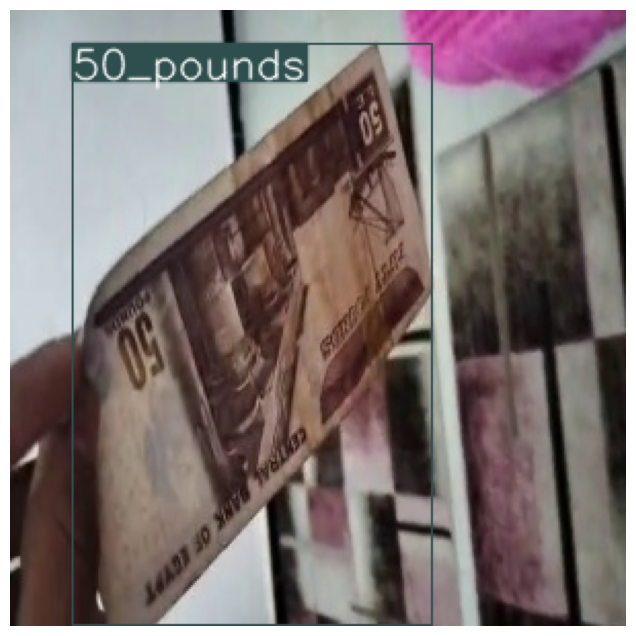

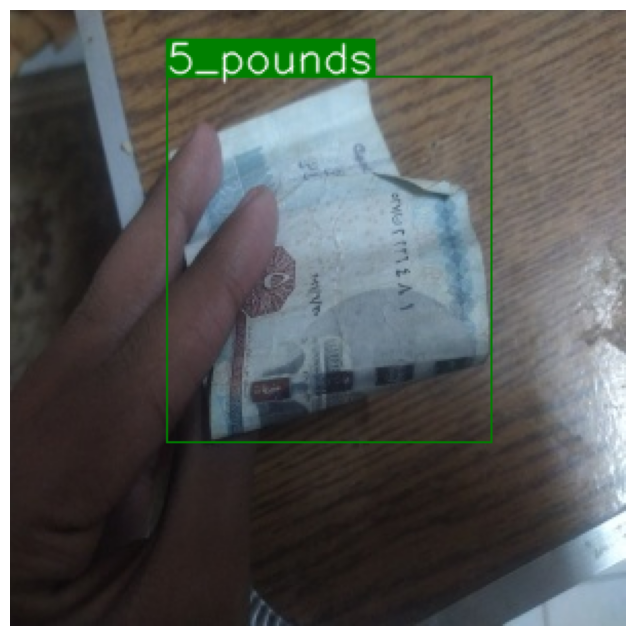

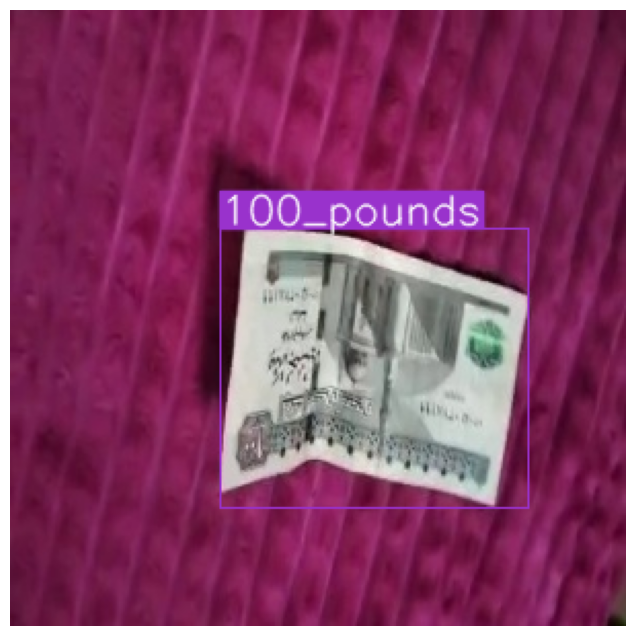

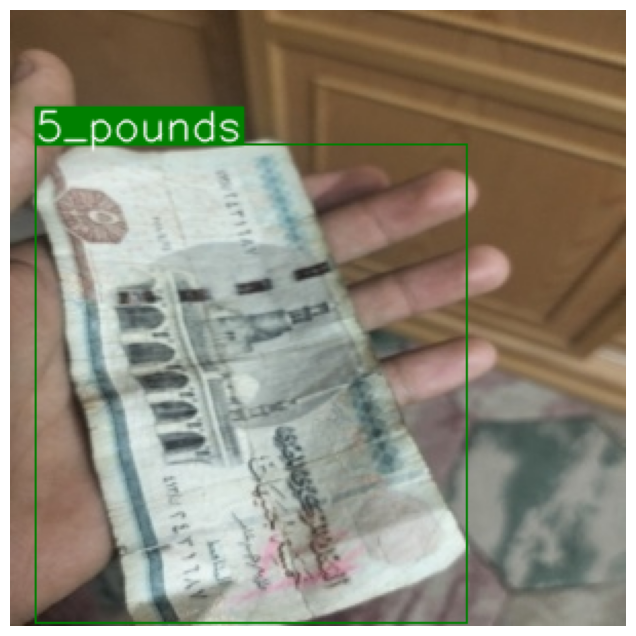

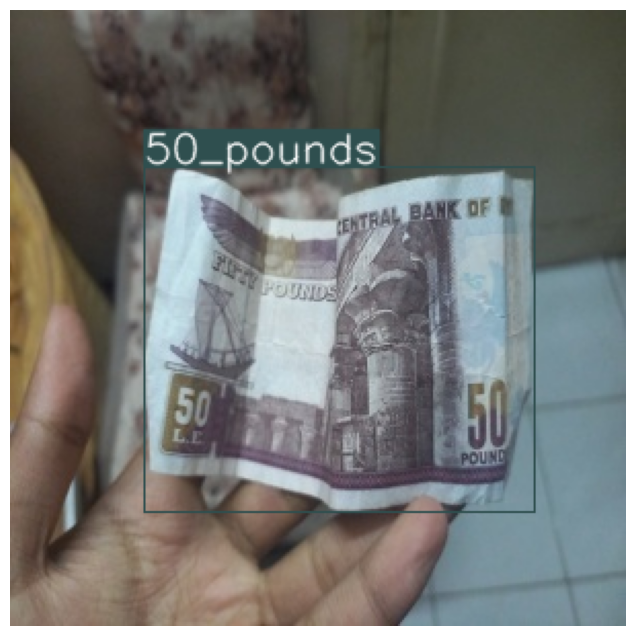

...

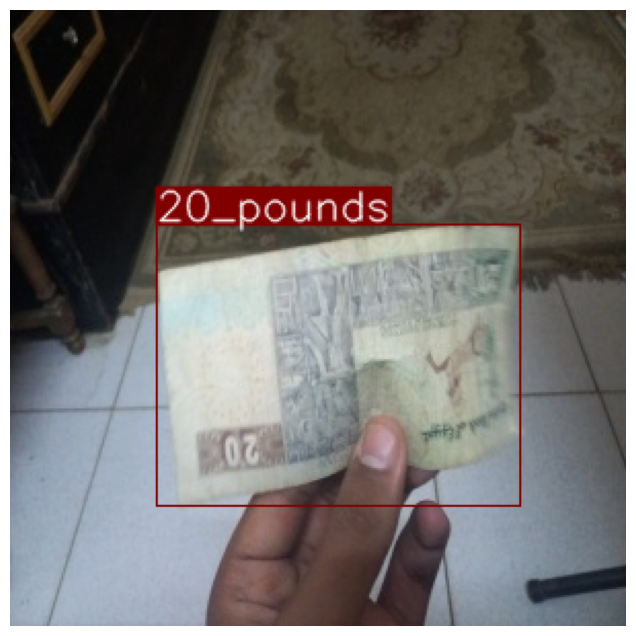

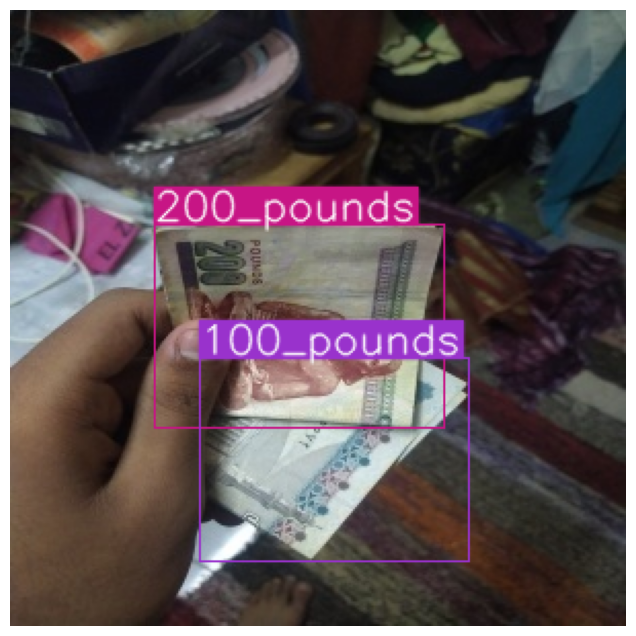

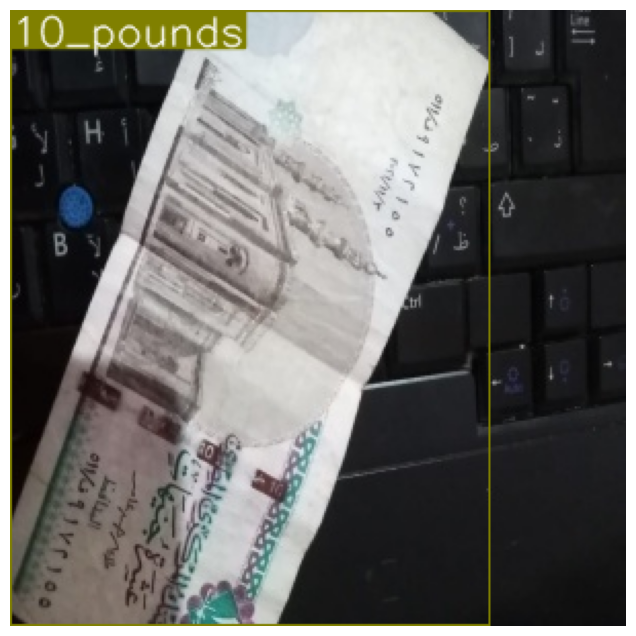

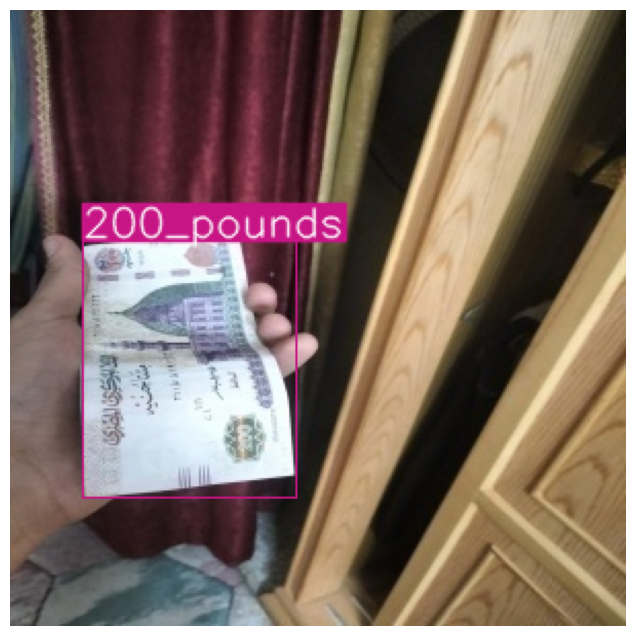

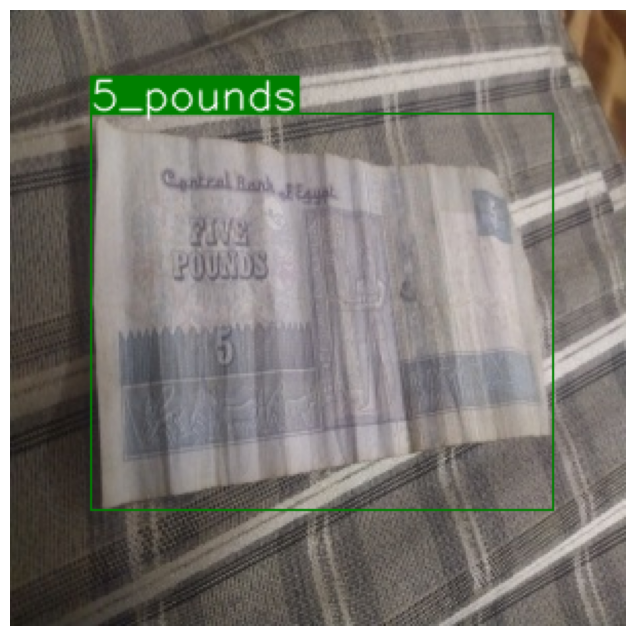

In [ ]:
for folder in ['train','val']:
        Images_path=os.path.join('/content',data,folder,'images')
        Labels_path=os.path.join('/content',data,folder,'labels')
        image_shape=(300,300)
        view_data(Images_path,Labels_path,10,image_shape)

In [ ]:
train=pd.read_csv(r'/content/csv/train.csv')
train.drop(train.index[(train["class"] == "EOF")],axis=0,inplace=True)
train.to_csv(r'/content/csv/train.csv', index=None)
train['class'].value_counts()

100_pounds     600
10_pounds      572
20_pounds      557
5_pounds       546
50_pounds      530
200_pounds     523
1_pound        315
50_piasters    204
25_piasters    140
Name: class, dtype: int64

In [ ]:
val=pd.read_csv(r'/content/csv/val.csv')
val.drop(val.index[(val["class"] == "EOF")],axis=0,inplace=True)
val.to_csv(r'/content/csv/val.csv', index=None)
val['class'].value_counts()

10_pounds      190
100_pounds     172
20_pounds      171
200_pounds     164
5_pounds       143
50_pounds      140
1_pound         98
50_piasters     68
25_piasters     38
Name: class, dtype: int64

#3.Install TensorFlow Object Detection Dependencies

In [ ]:
# Clone the tensorflow models repository from GitHub
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3733, done.
remote: Counting objects: 100% (3733/3733), done.
remote: Compressing objects: 100% (2853/2853), done.
remote: Total 3733 (delta 1068), reused 1851 (delta 830), pack-reused 0
Receiving objects: 100% (3733/3733), 48.74 MiB | 31.77 MiB/s, done.
Resolving deltas: 100% (1068/1068), done.


In [ ]:
# Copy setup files into models/research folder
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

In [ ]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API
!pip install /content/models/research/

# Need to downgrade to TF v2.8.0 due to Colab compatibility bug with TF v2.10 (as of 10/03/22)
!pip install tensorflow==2.8.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 41.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 630.1/630.1 kB 43.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 498.1/498.1 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 91.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Run Model Bulider Test file, just to verify everything's working properly
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrISt10unique_

#4.Create TFRecords

In [ ]:
### This creates a a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF >> /content/currency.txt
25_piasters
50_piasters
1_pound
5_pounds
10_pounds
20_pounds
50_pounds
100_pounds
200_pounds
EOF

In [ ]:
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

--2023-04-22 01:42:58--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4414 (4.3K) [text/plain]
Saving to: ‘create_tfrecord.py’

create_tfrecord.py  100%[===================>]   4.31K  --.-KB/s    in 0s      

2023-04-22 01:42:58 (54.7 MB/s) - ‘create_tfrecord.py’ saved [4414/4414]



In [ ]:
if augmentation_num:
  !python create_tfrecord.py --csv_input=/content/csv/train.csv --labelmap=/content/currency.txt --image_dir=/content/augmented_data/train/images --output_path=train.tfrecord
  !python create_tfrecord.py --csv_input=/content/csv/val.csv --labelmap=/content/currency.txt --image_dir=/content/augmented_data/val/images --output_path=val.tfrecord
else:
   !python create_tfrecord.py --csv_input=/content/csv/train.csv --labelmap=/content/currency.txt --image_dir=/content/data/train/images --output_path=train.tfrecord
   !python create_tfrecord.py --csv_input=/content/csv/val.csv --labelmap=/content/currency.txt --image_dir=/content/data/val/images --output_path=val.tfrecord

Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/val.tfrecord


In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

#5.Set Up Training Configuration and Train Custom TFLite Detection Model

In [ ]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    # The centernet model isn't working as of 9/10/22
    #'centernet-mobilenet-v2': {
    #    'model_name': 'centernet_mobilenetv2fpn_512x512_coco17_od',
    #    'base_pipeline_file': 'pipeline.config',
    #    'pretrained_checkpoint': 'centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz',
    #}
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

In [ ]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2023-04-22 01:43:21--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.1.128, 2607:f8b0:4001:c0f::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.1.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  --.-KB/s    in 0.1s    

2023-04-22 01:43:21 (170 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2023-04-22 01:43:22--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.

In [ ]:
# Set training parameters for the model
num_steps = 25000
batch_size = 16

In [ ]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 9


In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
    
    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)
      
      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)
    
    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [ ]:
# Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 9
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.9/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrISt10unique_

#6.Convert Model to TensorFlow Lite

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/currency.tflite', 'wb') as f:
  f.write(tflite_model)

#7.Test TensorFlow Lite Model and Calculate mAP

In [ ]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape 
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))
              
              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

      
      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()
      
      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)      
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/data/test/images'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/currency.tflite'  # Path to .tflite model file   #/content/custom_model_lite/detect (1).tflite
PATH_TO_LABELS='/content/currency.txt'   # Path to labelmap.txt file
min_conf_threshold=0.1   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 20   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/* 
rm input/ground-truth/* 
rm input/images-optional/* 
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

In [ ]:
Labels_path='/content/data/test/labels'
text_folder=os.path.join('/content/rhs')
convert_json_to_txt(Labels_path,text_folder)

In [ ]:
!cp /content/data/test/images/* /content/mAP/input/images-optional
!mv /content/rhs/* /content/mAP/input/ground-truth/ 

In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/data/test/images'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/currency.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/currency.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/currency.txt

#8.Deploy TensorFlow Lite Model

In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/currency.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

In [ ]:
!rm -rf /content/mAP/outputs